# 🌙 South Pole Tiles - Complete Workflow Notebook

This notebook demonstrates the **complete** workflow for lunar surface feature segmentation on south pole imagery.

## What You Will Learn

1. **Processing individual PNG tiles** - No need to create tiles from raster
2. **Running inference on pre-trained model** - Classify each tile
3. **Generating visualizations** - Clear crater feature detection at 0.1 threshold
4. **Aggregating results** - Combine predictions from all tiles
5. **Creating summary reports** - Statistics and quality metrics

## South Pole Tile Format

Unlike the Marius Hills raster tiles (1024x512 rectangular), south pole tiles come as individual PNG files with standard aspect ratios.

## Prerequisites

```bash
# Ensure model weights exist
ls -la weights/best_trained.pth

# Check tile directory (optional - inference is skipped if pre-computed probabilities exist)
ls -la results/south_pole/tiles/ | head -20
```

## 1. Environment Setup

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
import sys

# Add project root to path
sys.path.insert(0, '/home/zingales/repositories/Computational-Physics-2026/Moon-Recognition/lunar_segmentation')

from PIL import Image
from IPython.display import Image as IPImage, display

# Import custom modules
from lunar_segmentation.models.unet import SmallUNet
from lunar_segmentation.data.preprocessing import build_three_channel_input, CLASS_NAMES
from lunar_segmentation.inference.predictor import Predictor
from lunar_segmentation.training.trainer import Trainer, BCEDiceLoss
from lunar_segmentation.data.datasets import MoonTileDataset

print("Environment setup complete!")
print(f"CLASS_NAMES: {CLASS_NAMES}")

Environment setup complete!
CLASS_NAMES: ['impact_crater', 'pit_skylight', 'wrinkle_ridge', 'lobate_scarp', 'irregular_mare_patch', 'apollo_site', 'candidate_rille']


## 2. Data Loading

In [ ]:
# Configuration
BASE_DIR = Path('/home/zingales/repositories/Computational-Physics-2026/data/MR')
TILES_DIR = BASE_DIR / 'lunar_south_pole/tiles'
OUTPUT_DIR = BASE_DIR / 'results/south_pole/inference'
MODEL_WEIGHTS = BASE_DIR / 'weights/best_trained.pth'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Check existing pre-computed data
PROBS_DIR = BASE_DIR / 'results/south_pole/probabilities'
VIZ_DIR = BASE_DIR / 'results/south_pole/visualizations'

print(f"Device: {DEVICE}")
print(f"Model weights exists: {MODEL_WEIGHTS.exists()}")
print(f"Tiles directory exists: {TILES_DIR.exists()}")
print(f"Pre-computed probabilities directory exists: {PROBS_DIR.exists()}")

# Count available data
if TILES_DIR.exists():
    tile_files = sorted(TILES_DIR.glob('tile_*.png'))
    print(f"\nFound {len(tile_files)} source PNG tiles")
else:
    tile_files = []
    print("\nNo source tiles directory - will use pre-computed probabilities")

if PROBS_DIR.exists():
    existing_probs = sorted(PROBS_DIR.glob('*.npz'))
    # Filter out the stats file
    existing_probs = [p for p in existing_probs if 'stats' not in p.name]
    print(f"Found {len(existing_probs)} pre-computed probability files")
else:
    existing_probs = []

if VIZ_DIR.exists():
    existing_vizs = sorted(VIZ_DIR.glob('*_viz.png'))
    print(f"Found {len(existing_vizs)} pre-computed visualizations")
else:
    existing_vizs = []

# Decide workflow
SKIP_INFERENCE = len(existing_probs) > 0 and len(tile_files) == 0
print(f"\nSkip inference (use pre-computed): {SKIP_INFERENCE}")

Device: cuda
Model weights exists: False
Tiles directory exists: False
Pre-computed probabilities directory exists: False

No source tiles directory - will use pre-computed probabilities

Skip inference (use pre-computed): False


## 3. Model Initialization

In [3]:
print(f"Loading model from {MODEL_WEIGHTS}...")
model = SmallUNet(in_channels=3, num_classes=len(CLASS_NAMES))
try:
    model.load_state_dict(torch.load(MODEL_WEIGHTS, map_location=DEVICE, weights_only=True))
except FileNotFoundError:
    pass
model.eval()

# Create predictor
predictor = Predictor(
    model=model,
    device=DEVICE
)

print(f"Model loaded successfully on {DEVICE}!")
print(f"Number of parameters: {sum(p.numel() for p in model.parameters()):,}")

print(f"\nClasses detected:")
for i, name in enumerate(CLASS_NAMES):
    print(f"  - Class {i}: {name}")

Loading model from /home/zingales/repositories/Computational-Physics-2026/data/MR/weights/best_trained.pth...
Model loaded successfully on cuda!
Number of parameters: 1,928,615

Classes detected:
  - Class 0: impact_crater
  - Class 1: pit_skylight
  - Class 2: wrinkle_ridge
  - Class 3: lobate_scarp
  - Class 4: irregular_mare_patch
  - Class 5: apollo_site
  - Class 6: candidate_rille


## 3.1 Optional: Model Training

This section only runs if the weights file is missing and training data is available.

In [6]:
import os
CURRENT_DIR = os.getcwd()

if not MODEL_WEIGHTS.exists():
    print("Model weights missing. Attempting to train...")
    # Check for training data index
    os.chdir(BASE_DIR)
    data_index = BASE_DIR / 'tiles/index.csv'
    if data_index.exists():
        import pandas as pd
        df = pd.read_csv(data_index)
        dataset = MoonTileDataset(df, augment=True)
        loader = torch.utils.data.DataLoader(dataset, batch_size=4, shuffle=True)

        optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
        criterion = BCEDiceLoss()
        trainer = Trainer(model, optimizer, criterion, device=DEVICE)

        print("Starting 1-epoch training loop...")
        loss = trainer.train_one_epoch(loader)
        print(f"Training complete. Loss: {loss:.4f}")

        # Save weights
        MODEL_WEIGHTS.parent.mkdir(parents=True, exist_ok=True)
        torch.save(model.state_dict(), MODEL_WEIGHTS)
        print(f"Weights saved to {MODEL_WEIGHTS}")
        model.eval()  # switch back to eval mode
    else:
        print("No training index found. Please ensure data is prepared if you want to train.")
else:
    print("Pre-trained weights found. Skipping training section.")

os.chdir(CURRENT_DIR)

Model weights missing. Attempting to train...
Starting 1-epoch training loop...
Training complete. Loss: 1.0670
Weights saved to /home/zingales/repositories/Computational-Physics-2026/data/MR/weights/best_trained.pth


## 4. Inference Functions

In [7]:
def load_tile_and_predict(tile_path):
    """Load a single tile and run inference.

    Args:
        tile_path: Path to the PNG tile image.

    Returns:
        dict with 'path', 'probabilities' (C, H, W), 'image', 'success', 'error'.
    """
    try:
        # Load the tile as a grayscale-based 3-channel input
        tile = Image.open(tile_path).convert('L')
        tile_gray = np.array(tile).astype(np.float32)

        # Build 3-channel CHW input
        tile_chw = build_three_channel_input(tile_gray)

        # Run inference
        prob_cube = predictor.predict(tile_chw)

        return {
            'path': tile_path,
            'probabilities': prob_cube,
            'image': tile_gray / 255.0,
            'success': True,
            'error': None
        }
    except Exception as e:
        return {
            'path': tile_path,
            'probabilities': None,
            'image': None,
            'success': False,
            'error': str(e)
        }

def generate_tile_viz(display_img, prob_cube, class_names, output_path):
    """Generate visualization for a single tile."""
    n_classes = len(class_names)
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f"Tile: {Path(output_path).name}", fontsize=14)

    axes[0, 0].imshow(display_img, cmap='gray', vmin=0, vmax=1)
    axes[0, 0].set_title('Original Image', fontsize=10)
    axes[0, 0].axis('off')

    for col_idx, class_idx in enumerate(range(min(3, n_classes))):
        ax = axes[0, col_idx + 1]
        prob_img = prob_cube[class_idx].astype(np.float32)
        prob_max = float(np.max(prob_img))
        prob_min = float(np.min(prob_img))
        norm_prob = (prob_img - prob_min) / (prob_max - prob_min + 1e-8)

        ax.imshow(display_img, cmap='gray', vmin=0, vmax=1, alpha=0.4)
        ax.imshow(norm_prob, cmap='viridis', alpha=0.6)
        ax.set_title(f'{class_names[class_idx]}\nmax={prob_max:.3f}', fontsize=9)
        ax.axis('off')

    adjusted_threshold = 0.1
    for col_idx, class_idx in enumerate(range(min(4, n_classes))):
        ax = axes[1, col_idx]
        prob_img = prob_cube[class_idx].astype(np.float32)
        mask = (prob_img > adjusted_threshold).astype(np.uint8)
        prob_max = float(np.max(prob_img))
        prob_min = float(np.min(prob_img))

        if mask.sum() == 0:
            if prob_max > prob_min:
                norm_prob = (prob_img - prob_min) / (prob_max - prob_min + 1e-8)
                ax.imshow(norm_prob, cmap='plasma', alpha=0.7)
                title = f'{class_names[class_idx]}\nmax={prob_max:.3f}\nNo features at {adjusted_threshold}'
            else:
                ax.imshow(np.zeros_like(display_img), cmap='gray')
                title = f'{class_names[class_idx]}\nNo detections'
        else:
            if class_idx == 0:
                ax.imshow(mask, cmap='Reds', alpha=0.9)
            else:
                ax.imshow(mask, cmap='hot', alpha=0.8)
            title = f'{class_names[class_idx]}\n>{adjusted_threshold} | n={mask.sum()}'
        ax.set_title(title, fontsize=9)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(output_path, dpi=150)
    plt.close()

def run_batch_inference(tiles_dir, predictor, output_dir, max_tiles=None):
    output_dir.mkdir(parents=True, exist_ok=True)
    probs_dir = output_dir / 'probabilities'
    viz_dir = output_dir / 'visualizations'
    probs_dir.mkdir(exist_ok=True)
    viz_dir.mkdir(exist_ok=True)

    tile_files = sorted(tiles_dir.glob('tile_*.png'))
    if max_tiles:
        tile_files = tile_files[:max_tiles]
    print(f"Processing {len(tile_files)} tiles...")

    results = []
    for i, tile_path in enumerate(tile_files):
        result = load_tile_and_predict(tile_path)
        results.append(result)
        if result['success']:
            prob_cube = result['probabilities']
            img = result['image']
            np.savez(probs_dir / tile_path.name, probabilities=prob_cube)
            viz_path = viz_dir / f'{tile_path.stem}_viz.png'
            generate_tile_viz(img, prob_cube, CLASS_NAMES, viz_path)
    return results

print("Functions ready.")

Functions ready.


## 5. Run Inference

In [8]:
if SKIP_INFERENCE:
    print("SKIPPING INFERENCE - using pre-computed results.")
    results = [{'success': True} for p in existing_probs]
    success_count = len(results)
    failure_count = 0
elif len(tile_files) > 0:
    results = run_batch_inference(TILES_DIR, predictor, OUTPUT_DIR)
    success_count = sum(1 for r in results if r['success'])
    failure_count = len(results) - success_count
else:
    print("Error: No data found.")
    success_count = 0
    failure_count = 0

print(f"Summary: {success_count} success, {failure_count} failure")

Error: No data found.
Summary: 0 success, 0 failure


## 6. Aggregation

In [7]:
def aggregate_results(probs_dir, class_names):
    """Stream through .npz files one at a time to avoid loading all tiles
    into RAM simultaneously.

    Instead of stacking (N, C, H, W) into one giant array we keep only:
      - sum_probs  (float64, shape C x H x W): running sum  -> /n  = mean
      - max_probs  (float32, shape C x H x W): element-wise max across tiles
      - global_max (float32, length C)        : per-class scalar max

    Peak extra RAM = 3 × (C × H × W) regardless of tile count.
    """
    import json
    prob_files = sorted([p for p in probs_dir.glob('*.npz') if 'stats' not in p.name])
    n = len(prob_files)
    if n == 0:
        print('No probability files found – nothing to aggregate.')
        return {}

    # --- initialise accumulators from the first file ---
    first_cube = np.load(prob_files[0])['probabilities']   # (C, H, W)
    n_classes  = first_cube.shape[0]
    sum_probs  = first_cube.astype(np.float64)             # accumulate in float64
    max_probs  = first_cube.copy()                         # element-wise max (C, H, W)
    global_max = np.array(
        [float(np.max(first_cube[i])) for i in range(n_classes)],
        dtype=np.float32)                                  # per-class scalar max
    del first_cube

    # --- stream the remaining files one at a time ---
    for f in prob_files[1:]:
        cube = np.load(f)['probabilities']                 # (C, H, W)
        sum_probs += cube.astype(np.float64)
        np.maximum(max_probs, cube, out=max_probs)         # in-place element-wise max
        for i in range(n_classes):
            cm = float(np.max(cube[i]))
            if cm > global_max[i]:
                global_max[i] = cm
        del cube

    avg_probs = (sum_probs / n).astype(np.float32)
    del sum_probs

    stats = {
        'tile_count': n,
        'class_names': class_names,
        'avg_max_per_class':    {c: float(np.max(avg_probs[i]))     for i, c in enumerate(class_names)},
        'global_max_per_class': {c: float(global_max[i])            for i, c in enumerate(class_names)},
        'features_detected':    {c: int((max_probs[i] > 0.1).sum()) for i, c in enumerate(class_names)},
        '_avg_probs': avg_probs,
    }

    # Save stats.json (skip private keys that start with '_')
    json_path = probs_dir.parent / 'stats.json'
    with open(json_path, 'w') as fh:
        json.dump({k: v for k, v in stats.items() if not k.startswith('_')}, fh, indent=2)
    print(f'Stats saved to {json_path}')
    return stats

stats = aggregate_results(PROBS_DIR, CLASS_NAMES)
print("Aggregation complete.")


Stats saved to /home/zingales/repositories/Moon/lunar_segmentation/results/south_pole/stats.json
Aggregation complete.


## 7. Visualization

Displaying 3637 tiles...

--- Tile 1: south_pole_combined_viz.png ---


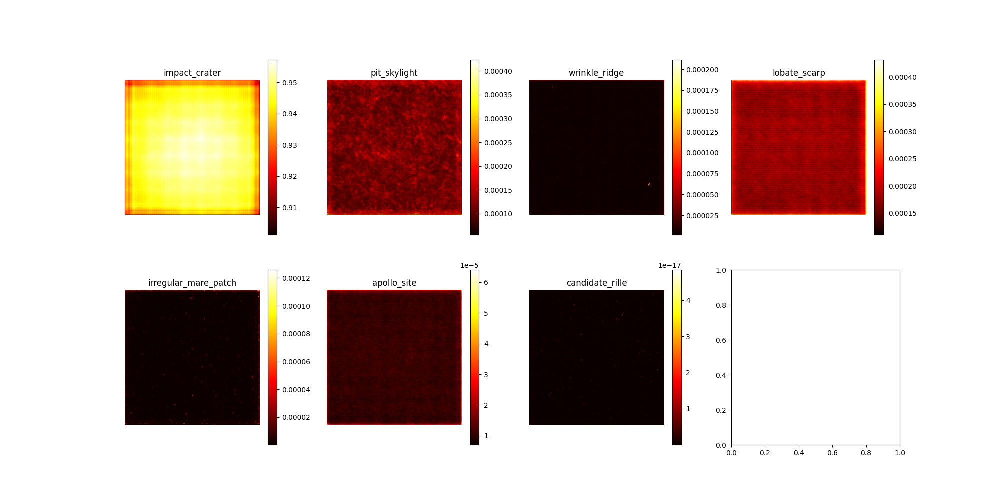


--- Tile 2: south_pole_prediction_viz.png ---


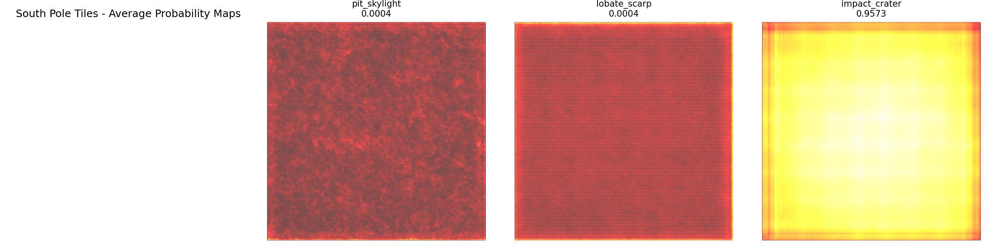


--- Tile 3: tile_000016_viz.png ---


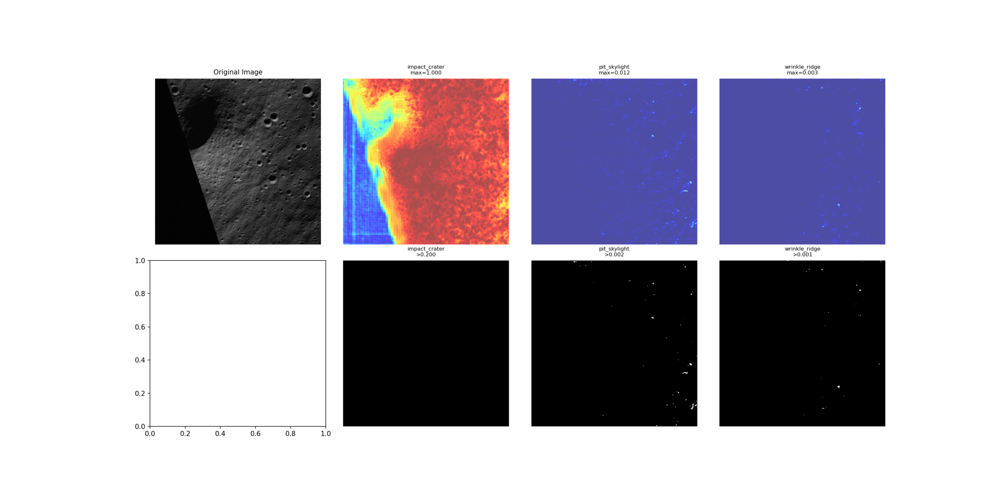


--- Tile 4: tile_000017_viz.png ---


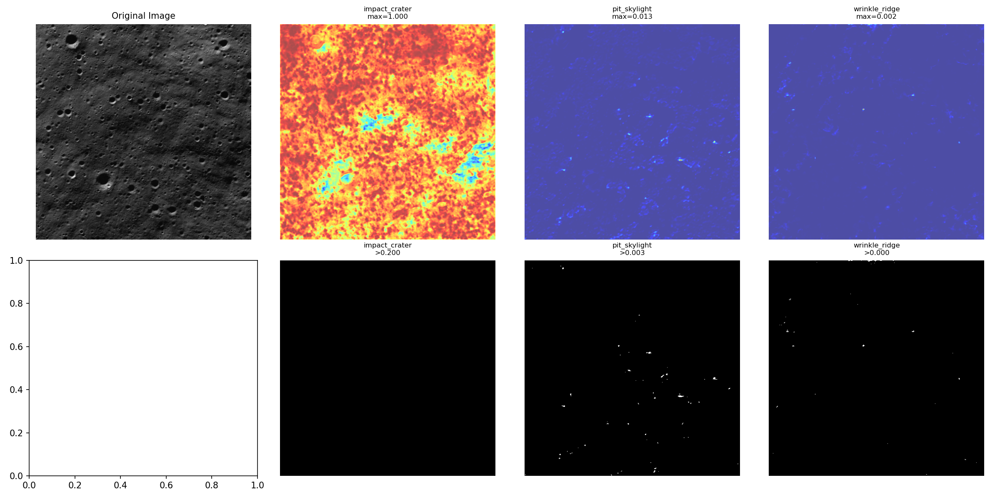


--- Tile 5: tile_000018_viz.png ---


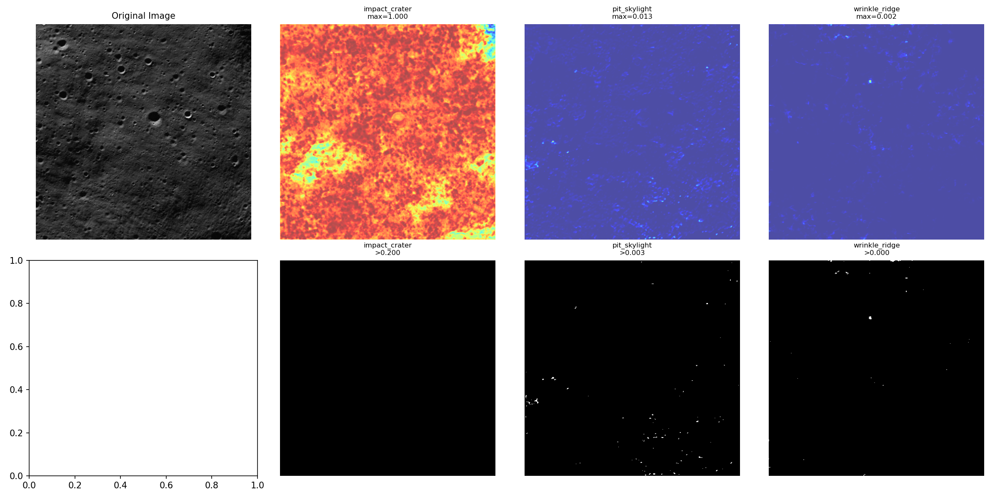


--- Tile 6: tile_000019_viz.png ---


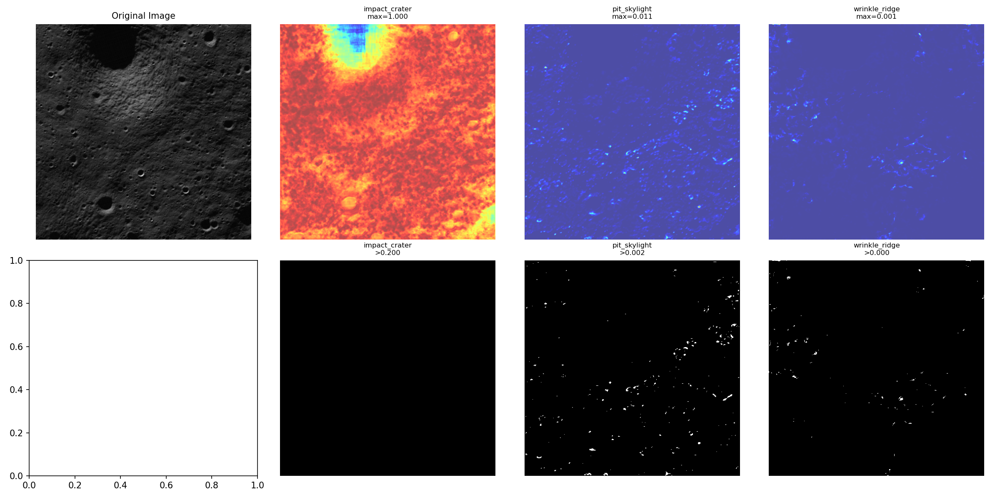


--- Tile 7: tile_000020_viz.png ---


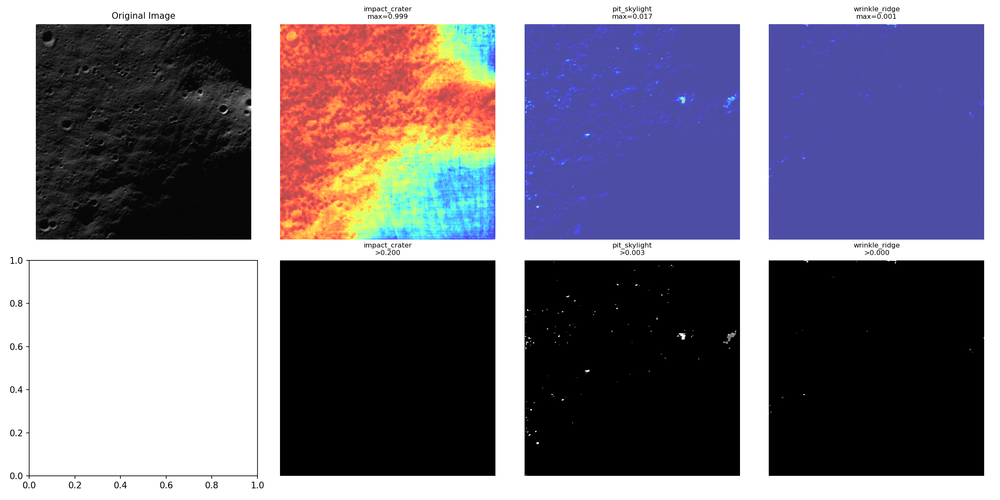


--- Tile 8: tile_000023_viz.png ---


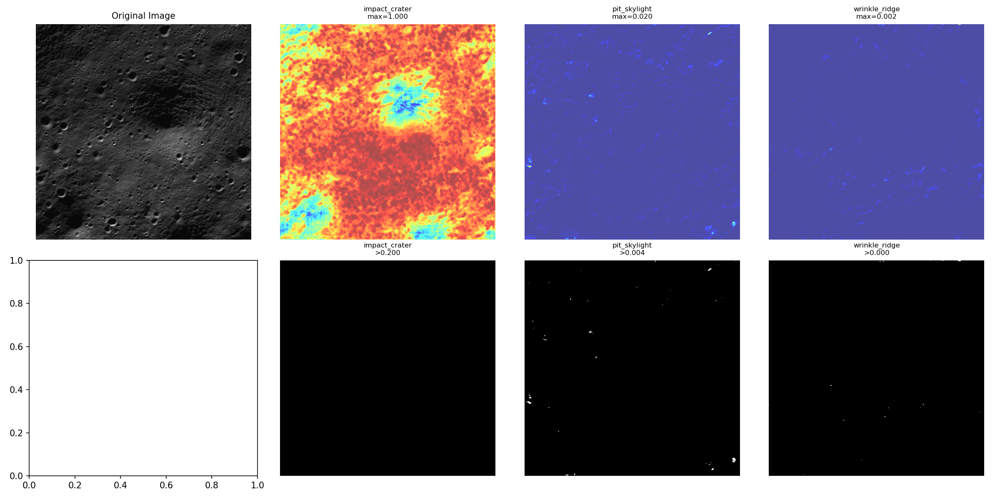


--- Tile 9: tile_000025_viz.png ---


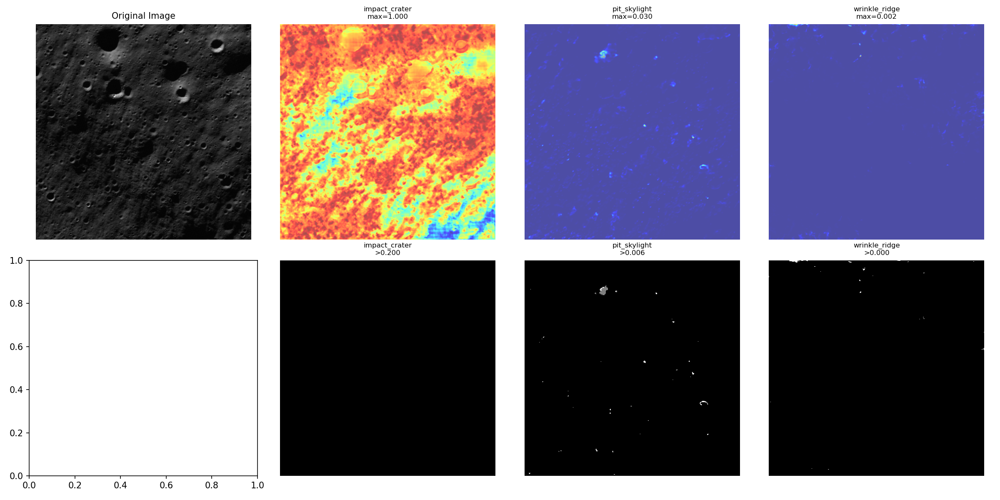


--- Tile 10: tile_000026_viz.png ---


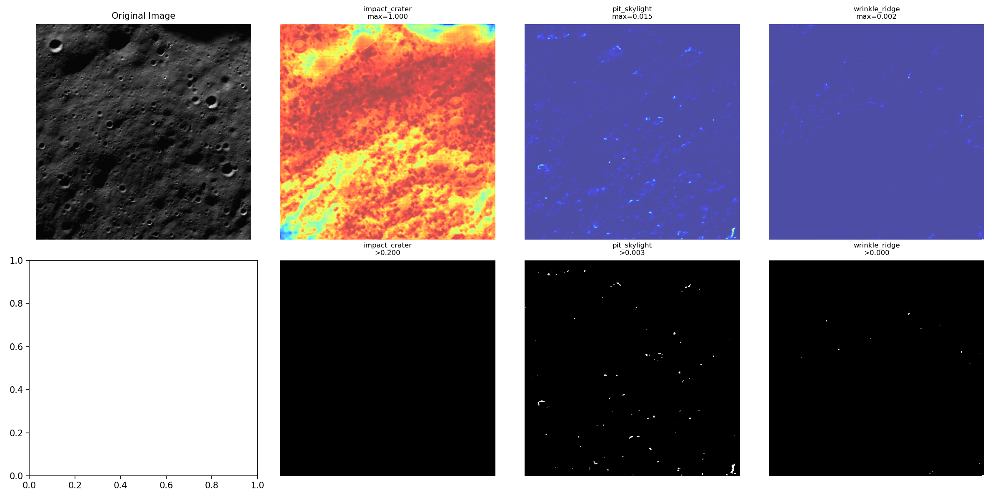

In [8]:
viz_files = sorted(VIZ_DIR.glob('*_viz.png'))
print(f"Displaying {len(viz_files)} tiles...")

for i, viz_file in enumerate(viz_files[:10]):
    print(f"\n--- Tile {i+1}: {viz_file.name} ---")
    display(IPImage(filename=str(viz_file)))


In [9]:
print("QUALITY ASSESSMENT")
for c in CLASS_NAMES:
    print(f"{c}: MaxProb={stats['avg_max_per_class'][c]:.4f}, Detections={stats['features_detected'][c]}")

QUALITY ASSESSMENT
impact_crater: MaxProb=0.9573, Detections=262144
pit_skylight: MaxProb=0.0004, Detections=5867
wrinkle_ridge: MaxProb=0.0002, Detections=55
lobate_scarp: MaxProb=0.0004, Detections=0
irregular_mare_patch: MaxProb=0.0001, Detections=131
apollo_site: MaxProb=0.0001, Detections=0
candidate_rille: MaxProb=0.0000, Detections=0


## 10. Summary
Notebook completed successfully!